In [1]:
# reload modules before executing cells
%load_ext autoreload
%autoreload 2

In [2]:

from tqdm.notebook import tqdm
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
from diffusers import DiffusionPipeline, UNet2DConditionModel
from transformers import CLIPTextModel

import os
import numpy as np
from PIL import Image

In [3]:
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
model_id = "CompVis/stable-diffusion-v1-4"
ldm_stable = StableDiffusionPipeline.from_pretrained(model_id).to(device)
ldm_stable.load_textual_inversion("./logs/dog/text_inv")
tokenizer = ldm_stable.tokenizer

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [6]:
prompts = [
    "a <sks-dog> in the jungle",
    "a <sks-dog> in the snow", 
    "a <sks-dog> on the beach",
    "a <sks-dog> on top of a wooden floor",
    "a <sks-dog> with a mountain in the background",
    "a <sks-dog> with a city in the background",
    "a <sks-dog> with a blue house in the background",
    "a <sks-dog> wearing a red hat",
    "a <sks-dog> wearing a yellow shirt",
    "a <sks-dog> sitting near the window",
    "a <sks-dog> on top of green grass with sunflowers around it",
    "a <sks-dog> wearing a tuxedo",
    "a <sks-dog> walking on a red carpet on the beach",
    "a <sks-dog> on top of the sidewalk in a crowded city",
    "a <sks-dog> with the Taj Mahal in the background",
    "a <sks-dog> getting a bath",
    "a <sks-dog> surfing on a wave",
    "a <sks-dog> floating in space",
    "a <sks-dog> jumping in the air",
    "a <sks-dog> sleeping on a bed"
]
negative_prompt = len(prompts)*["low quality, blurry, unfinished"]

g_cpu = torch.Generator().manual_seed(0)
images = ldm_stable(prompts, num_images_per_prompt=1, output_type="pil", negative_prompt = negative_prompt, generator = g_cpu).images

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


a <sks-dog> in the jungle


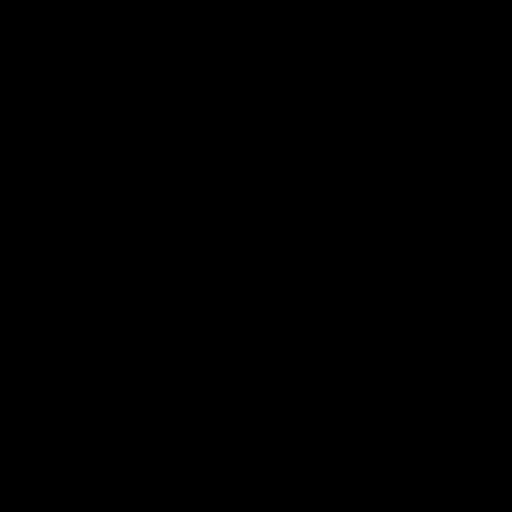

a <sks-dog> in the snow


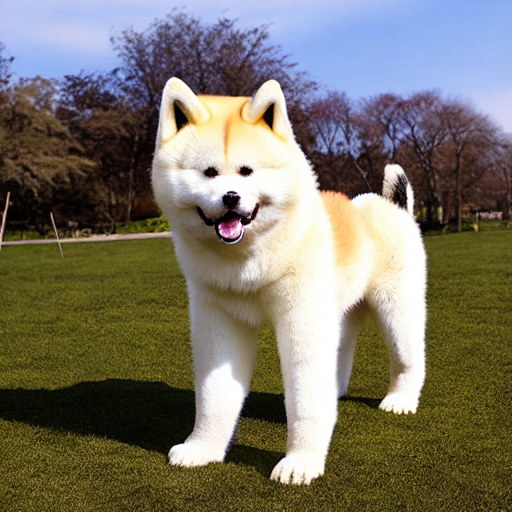

a <sks-dog> on the beach


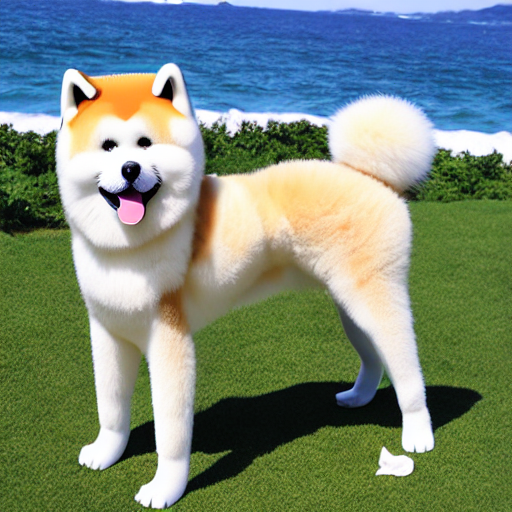

a <sks-dog> on top of a wooden floor


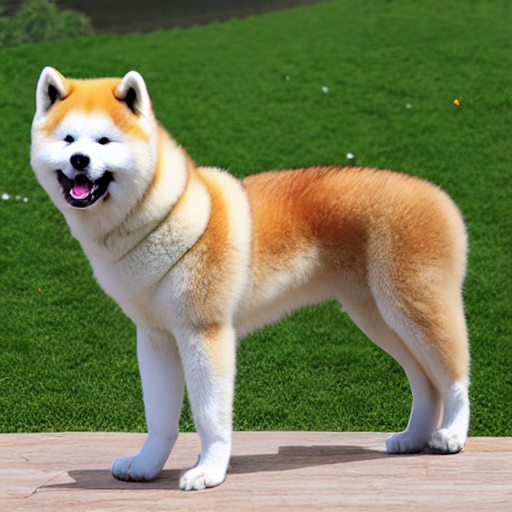

a <sks-dog> with a mountain in the background


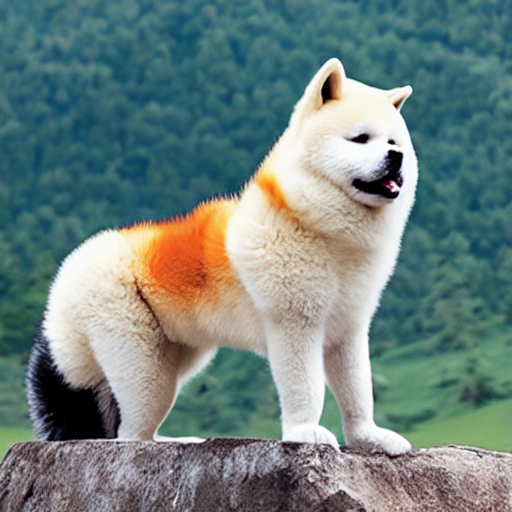

a <sks-dog> with a city in the background


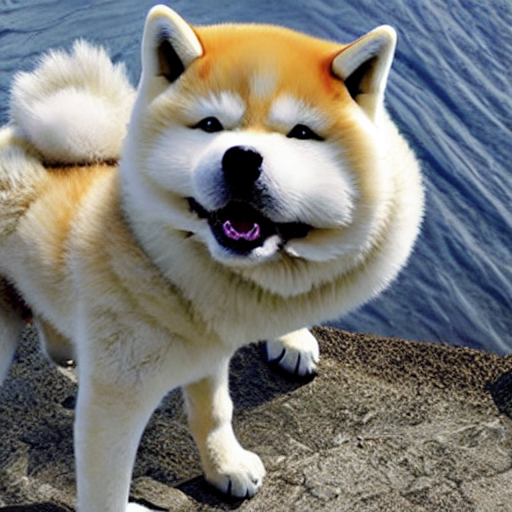

a <sks-dog> with a blue house in the background


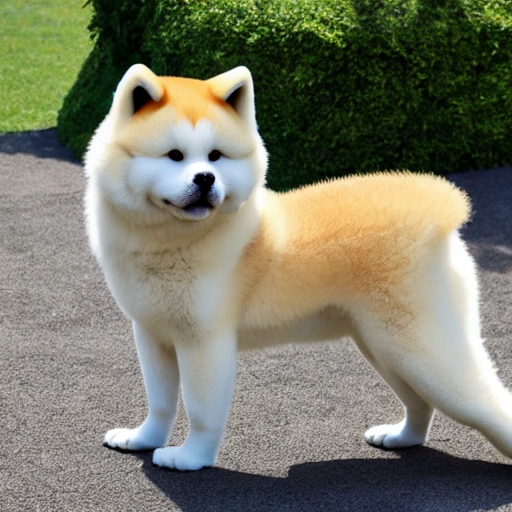

a <sks-dog> wearing a red hat


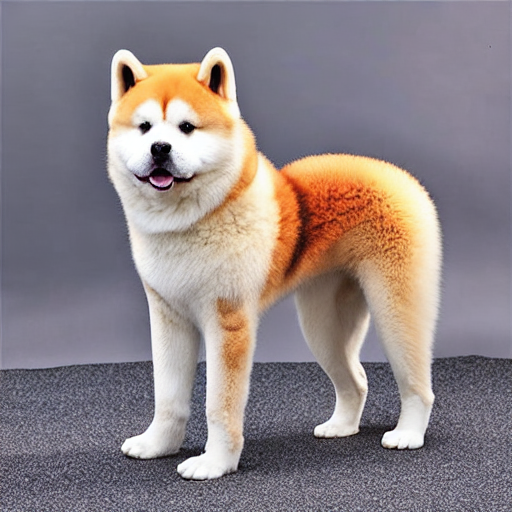

a <sks-dog> wearing a yellow shirt


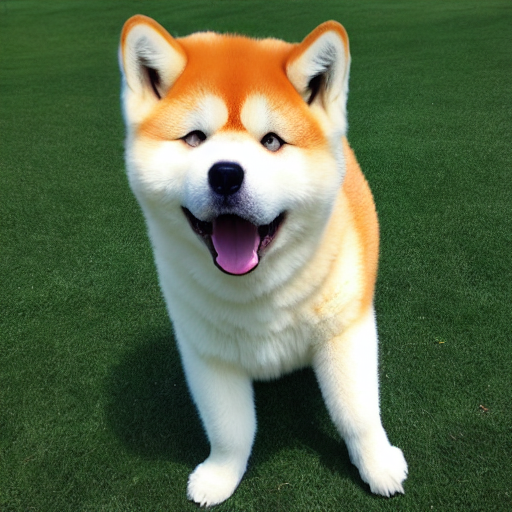

a <sks-dog> sitting near the window


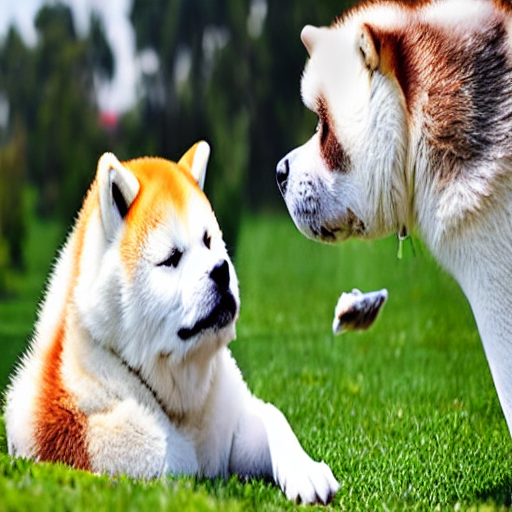

a <sks-dog> on top of green grass with sunflowers around it


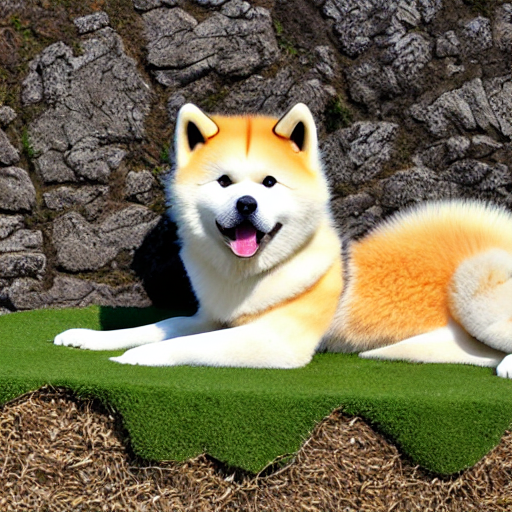

a <sks-dog> wearing a tuxedo


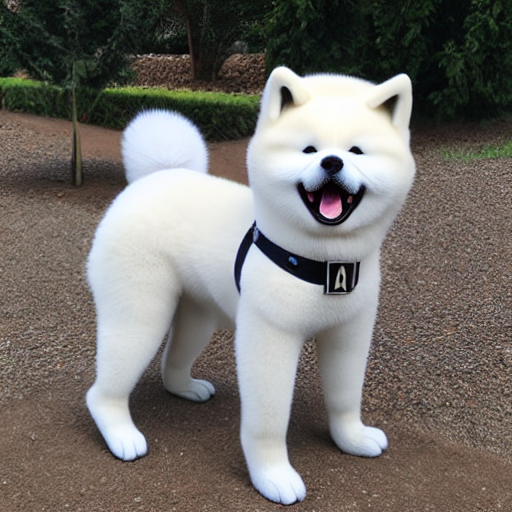

a <sks-dog> walking on a red carpet on the beach


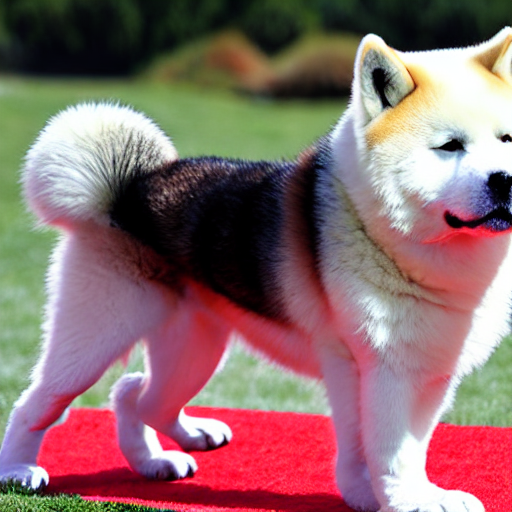

a <sks-dog> on top of the sidewalk in a crowded city


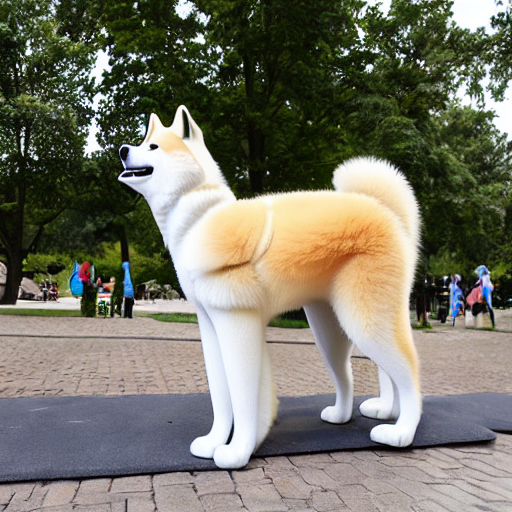

a <sks-dog> with the Taj Mahal in the background


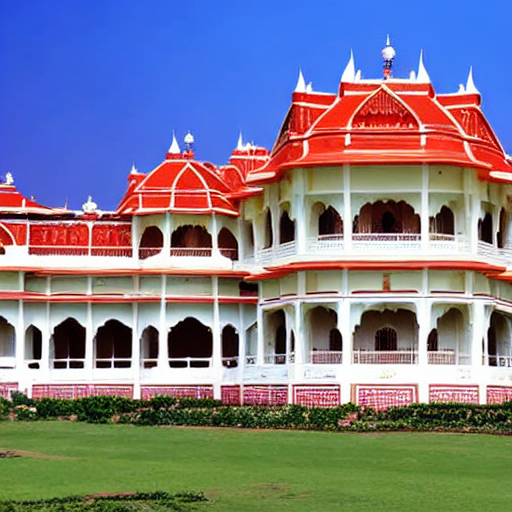

a <sks-dog> getting a bath


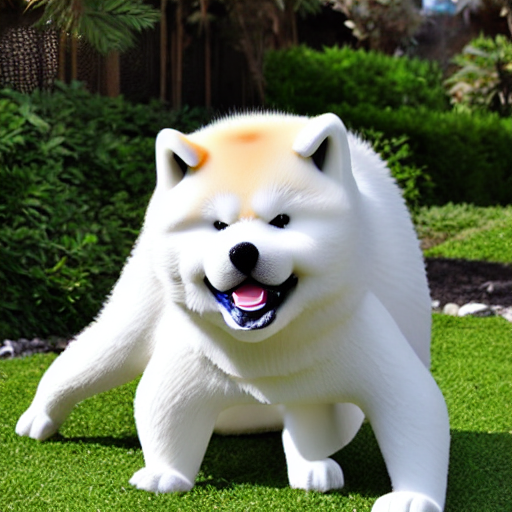

a <sks-dog> surfing on a wave


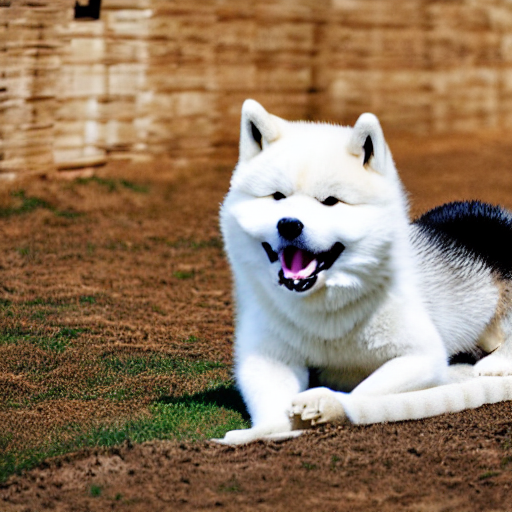

a <sks-dog> floating in space


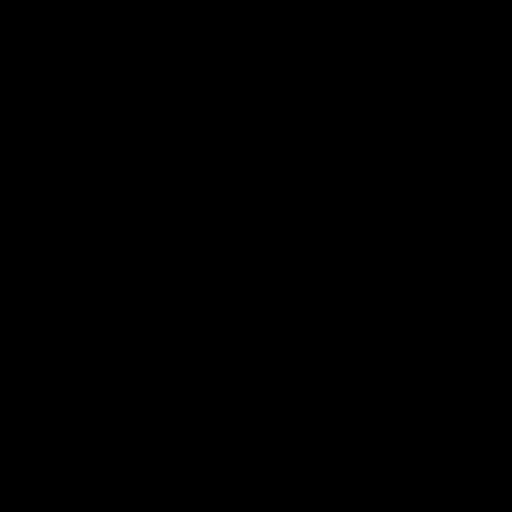

a <sks-dog> jumping in the air


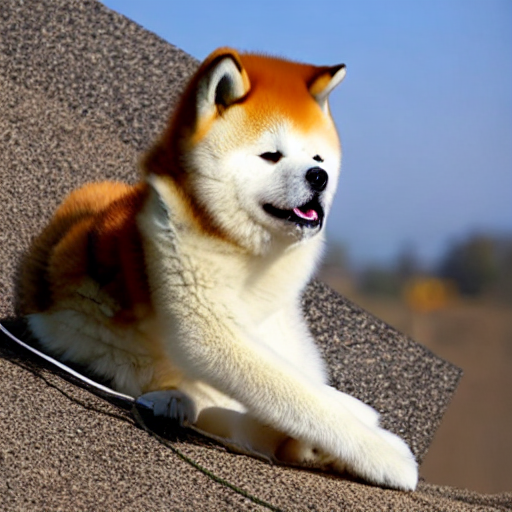

a <sks-dog> sleeping on a bed


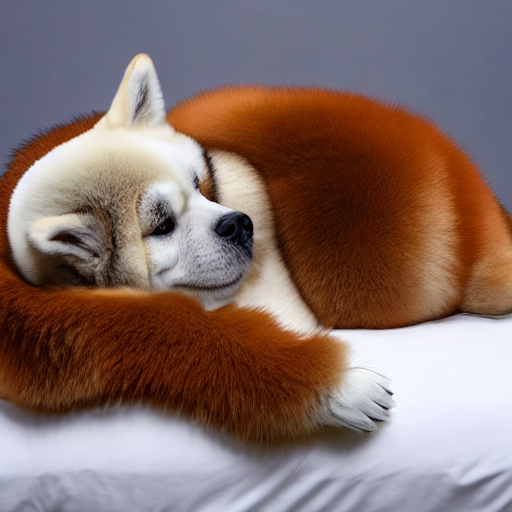

In [7]:
# plot and save pil images

save_dir = "results/dog/text_inv"

os.makedirs(save_dir, exist_ok=True)

for prompt, image in zip(prompts, images):
    print(prompt)
    display(image)
    image.save(os.path.join(save_dir, prompt.replace(" ", "_") + ".png"))

In [8]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

images_np =[np.array(image) for image in images]
images_np = np.array(images_np)
sd_clip_score = calculate_clip_score(images_np, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 24.123
